### Daily Challenge: Hands-On Image Transformation and Visualization


## Import Libraries

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import random
import os
import pandas as pd
from PIL import Image
from scipy.ndimage import rotate
import warnings
warnings.filterwarnings('ignore')

## Dataset Exploration

In [ ]:
dataset_path = r"Flower Color Images Dataset"
flowers_path = os.path.join(dataset_path, "flowers", "flowers")
flower_images_path = os.path.join(dataset_path, "flower_images", "flower_images")
labels_path = os.path.join(flower_images_path, "flower_labels.csv")

print(f"Dataset path exists: {os.path.exists(dataset_path)}")
print(f"Flowers path exists: {os.path.exists(flowers_path)}")
print(f"Flower images path exists: {os.path.exists(flower_images_path)}")
print(f"Labels file exists: {os.path.exists(labels_path)}")

# Count images in each folder
if os.path.exists(flowers_path):
    flowers_count = len([f for f in os.listdir(flowers_path) if f.endswith('.png')])
    print(f"Number of images in flowers folder: {flowers_count}")

if os.path.exists(flower_images_path):
    flower_images_count = len([f for f in os.listdir(flower_images_path) if f.endswith('.png')])
    print(f"Number of images in flower_images folder: {flower_images_count}")

Dataset path exists: True
Flowers path exists: True
Flower images path exists: True
Labels file exists: True
Number of images in flowers folder: 603
Number of images in flower_images folder: 210


In [ ]:
if os.path.exists(labels_path):
    labels_df = pd.read_csv(labels_path)
    print("Labels DataFrame:")
    print(labels_df.head(10))
    print(f"\nUnique labels: {labels_df['label'].unique()}")
    print(f"Label distribution:")
    print(labels_df['label'].value_counts().sort_index())

Labels DataFrame:
       file  label
0  0001.png      0
1  0002.png      0
2  0003.png      2
3  0004.png      0
4  0005.png      0
5  0006.png      1
6  0007.png      6
7  0008.png      0
8  0009.png      0
9  0010.png      0

Unique labels: [0 2 1 6 7 4 5 3 8 9]
Label distribution:
label
0    21
1    20
2    19
3    22
4    21
5    25
6    23
7    15
8    26
9    18
Name: count, dtype: int64


## Image Transformation Functions

In [ ]:
# rotate an image by 90 degrees
def rotate_image_90_degrees(image):
    """Rotate image by 90 degrees"""
    return rotate(image, 90, reshape=True, mode='nearest')

#  to rotate an image by 30 degrees
def rotate_image_30_degrees(image):
    """Rotate image by 30 degrees"""
    return rotate(image, 30, reshape=False, mode='nearest')

#  flip an image horizontally
def flip_horizontal(image):
    """Flip image horizontally"""
    return np.fliplr(image)

#  flip an image vertically
def flip_vertical(image):
    """Flip image vertically"""
    return np.flipud(image)

#  zoom in on an image (scale by 1.2x) using PIL
def zoom_image(image, scale_factor=1.2):
    """Zoom into image by scaling factor"""
    if len(image.shape) == 3:
        pil_image = Image.fromarray((image * 255).astype(np.uint8))
    else:
        pil_image = Image.fromarray(image)
    
    width, height = pil_image.size
    
    new_width = int(width * scale_factor)
    new_height = int(height * scale_factor)
    
    # Resize image
    resized_image = pil_image.resize((new_width, new_height), Image.Resampling.LANCZOS)
    
    return np.array(resized_image) / 255.0

## Load and Display Original Images

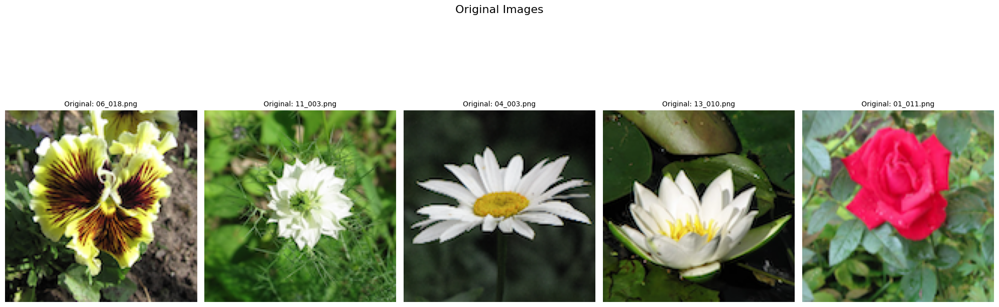

Loaded 5 images from Flower Color Images Dataset\flowers\flowers
Image shape: (128, 128, 4)


In [ ]:
list_img = []
file_names = []

plt.figure(figsize=(20, 8))

image_folder = flowers_path if os.path.exists(flowers_path) else flower_images_path

image_files = [f for f in os.listdir(image_folder) if f.endswith('.png')]

# Select 5 random images
selected_files = random.sample(image_files, min(5, len(image_files)))

for i, file in enumerate(selected_files):
    image_path = os.path.join(image_folder, file)
    img = mpimg.imread(image_path)
    list_img.append(img)
    file_names.append(file)
    
    ax = plt.subplot(1, 5, i+1)
    ax.set_title(f'Original: {file}', fontsize=10)
    plt.imshow(img)
    plt.axis('off')

plt.suptitle('Original Images', fontsize=16)
plt.tight_layout()
plt.show()

print(f"Loaded {len(list_img)} images from {image_folder}")
print(f"Image shape: {list_img[0].shape if list_img else 'No images loaded'}")

## Image Transformations - Rotation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09779262..1.0707166].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05604829..1.0486451].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05604829..1.0486451].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11750089..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11750089..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07379127..1.0048903].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07379127..1.

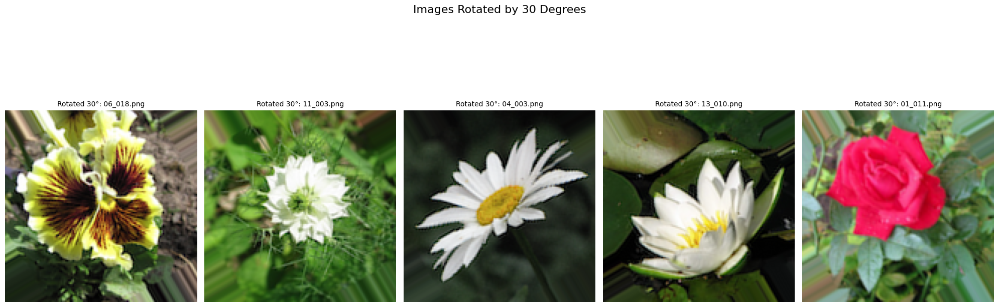

In [ ]:
# Display rotated images (30 degrees)
rotated_list_30 = []
plt.figure(figsize=(20, 8))

for i, img in enumerate(list_img):
    rotated_img = rotate_image_30_degrees(img)
    rotated_list_30.append(rotated_img)
    
    ax = plt.subplot(1, 5, i+1)
    ax.set_title(f'Rotated 30°: {file_names[i]}', fontsize=10)
    plt.imshow(rotated_img)
    plt.axis('off')

plt.suptitle('Images Rotated by 30 Degrees', fontsize=16)
plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.4691998e-17..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.746706e-17..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.746706e-17..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.9142426e-17..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.9142426e-17..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.0010906e-17..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.0010906e-17..1.0].
C

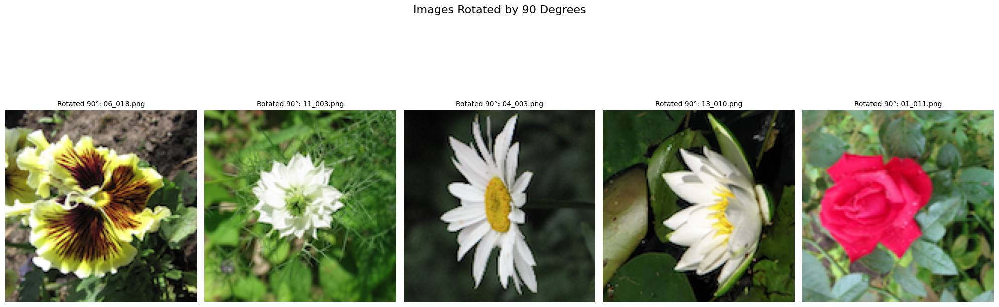

In [ ]:
#  rotated images (90 degrees)
rotated_list_90 = []
plt.figure(figsize=(20, 8))

for i, img in enumerate(list_img):
    rotated_img = rotate_image_90_degrees(img)
    rotated_list_90.append(rotated_img)
    
    ax = plt.subplot(1, 5, i+1)
    ax.set_title(f'Rotated 90°: {file_names[i]}', fontsize=10)
    plt.imshow(rotated_img)
    plt.axis('off')

plt.suptitle('Images Rotated by 90 Degrees', fontsize=16)
plt.tight_layout()
plt.show()

## Image Transformations - Flipping

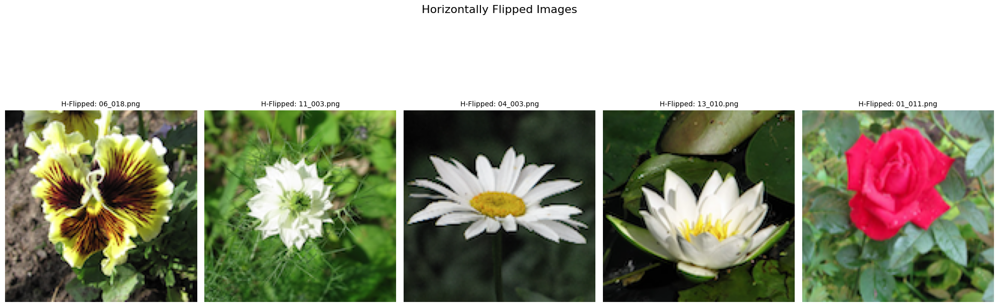

In [ ]:
flipped_horizontal = []
plt.figure(figsize=(20, 8))

for i, img in enumerate(list_img):
    flipped_img = flip_horizontal(img)
    flipped_horizontal.append(flipped_img)
    
    ax = plt.subplot(1, 5, i+1)
    ax.set_title(f'H-Flipped: {file_names[i]}', fontsize=10)
    plt.imshow(flipped_img)
    plt.axis('off')

plt.suptitle('Horizontally Flipped Images', fontsize=16)
plt.tight_layout()
plt.show()

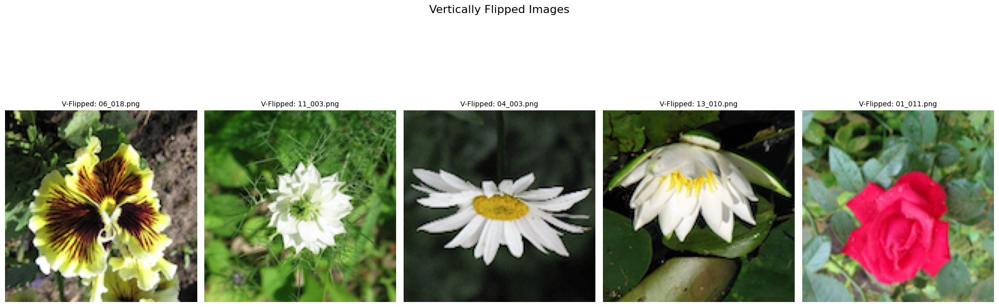

In [ ]:
#  vertically flipped images
flipped_vertical = []
plt.figure(figsize=(20, 8))

for i, img in enumerate(list_img):
    flipped_img = flip_vertical(img)
    flipped_vertical.append(flipped_img)
    
    ax = plt.subplot(1, 5, i+1)
    ax.set_title(f'V-Flipped: {file_names[i]}', fontsize=10)
    plt.imshow(flipped_img)
    plt.axis('off')

plt.suptitle('Vertically Flipped Images', fontsize=16)
plt.tight_layout()
plt.show()

## Image Transformations - Zooming

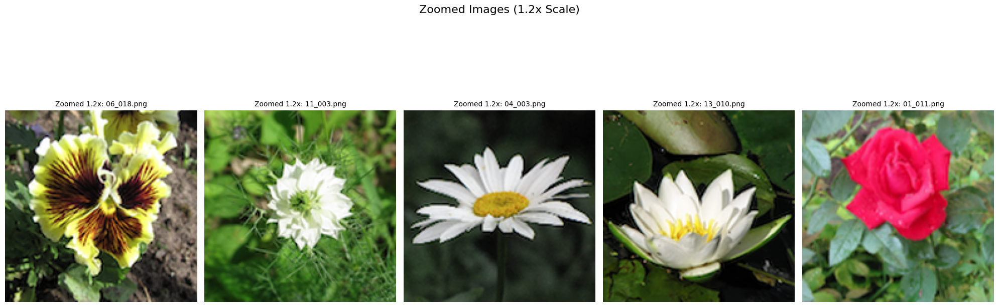

In [ ]:
#  zoomed images (1.2x scale)
zoomed_images = []
plt.figure(figsize=(20, 8))

for i, img in enumerate(list_img):
    zoomed_img = zoom_image(img, scale_factor=1.2)
    zoomed_images.append(zoomed_img)
    
    
    ax = plt.subplot(1, 5, i+1)
    ax.set_title(f'Zoomed 1.2x: {file_names[i]}', fontsize=10)
    plt.imshow(zoomed_img)
    plt.axis('off')

plt.suptitle('Zoomed Images (1.2x Scale)', fontsize=16)
plt.tight_layout()
plt.show()

## Comprehensive Comparison: Original vs All Transformations

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09779262..1.0707166].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05604829..1.0486451].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05604829..1.0486451].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11750089..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07379127..1.0048903].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11750089..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07379127..1.

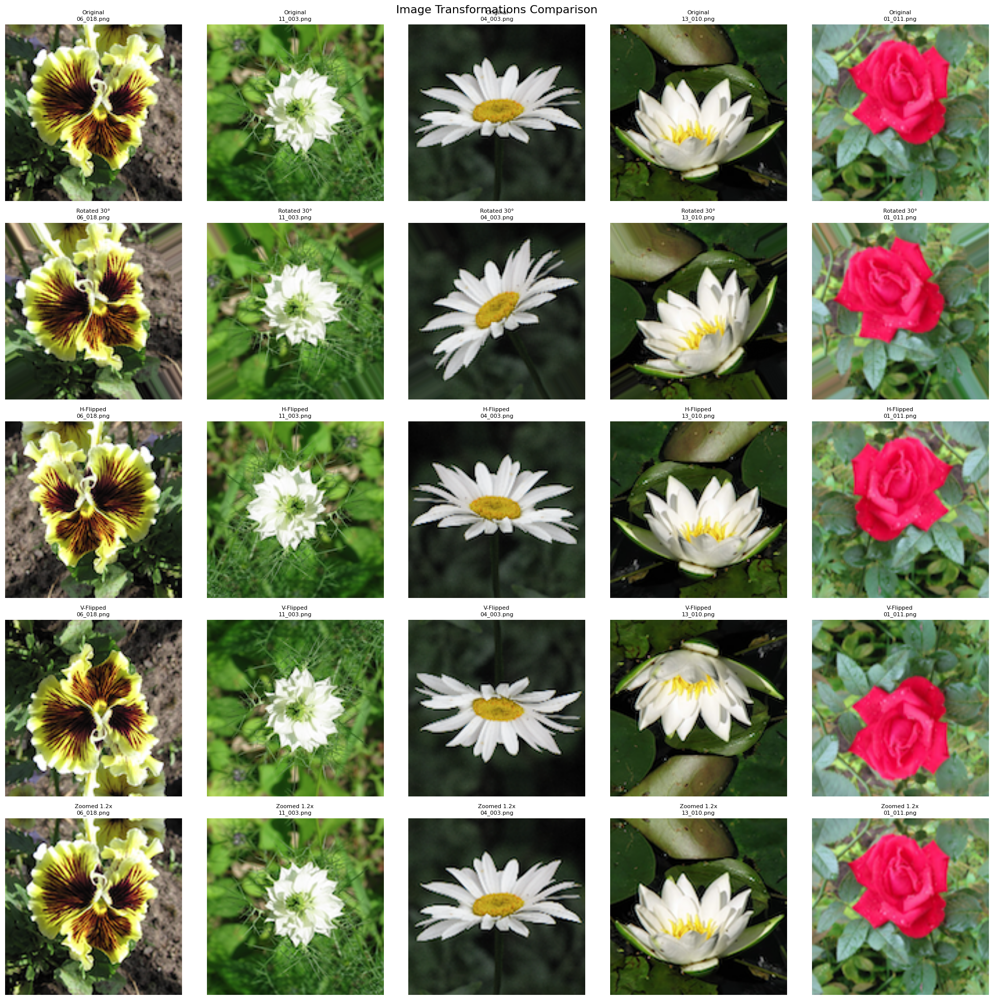

In [ ]:
fig, axes = plt.subplots(5, len(list_img), figsize=(20, 20))

transformation_names = ['Original', 'Rotated 30°', 'H-Flipped', 'V-Flipped', 'Zoomed 1.2x']
transformation_data = [
    list_img,
    rotated_list_30,
    flipped_horizontal,
    flipped_vertical,
    zoomed_images
]

for i, (transform_name, transform_imgs) in enumerate(zip(transformation_names, transformation_data)):
    for j, img in enumerate(transform_imgs):
        if len(list_img) == 1:
            ax = axes[i]
        else:
            ax = axes[i, j]
        
        ax.imshow(img)
        ax.set_title(f'{transform_name}\n{file_names[j]}', fontsize=8)
        ax.axis('off')

plt.suptitle('Image Transformations Comparison', fontsize=16)
plt.tight_layout()
plt.show()

## Additional Analysis: Combined Transformations

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09779262..1.0707166].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05604829..1.0486451].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11750089..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05604829..1.0486451].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11750089..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07379127..1.0048903].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07379127..1.

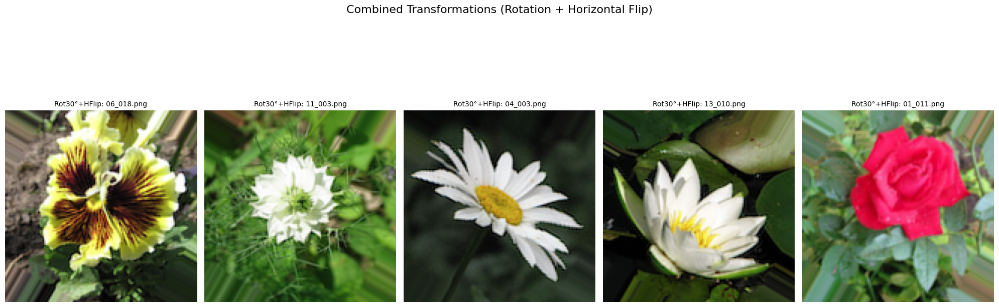

In [ ]:
combined_transforms = []
plt.figure(figsize=(20, 8))

for i, img in enumerate(list_img):
    rotated = rotate_image_30_degrees(img)
    combined = flip_horizontal(rotated)
    combined_transforms.append(combined)
    
    ax = plt.subplot(1, 5, i+1)
    ax.set_title(f'Rot30°+HFlip: {file_names[i]}', fontsize=10)
    plt.imshow(combined)
    plt.axis('off')

plt.suptitle('Combined Transformations (Rotation + Horizontal Flip)', fontsize=16)
plt.tight_layout()
plt.show()

## Summary and Statistics

In [ ]:
print("=== IMAGE TRANSFORMATION SUMMARY ===")
print(f"Original images processed: {len(list_img)}")
print(f"Image dimensions: {list_img[0].shape if list_img else 'N/A'}")
print(f"Transformations applied:")
print(f"  - 30-degree rotation")
print(f"  - 90-degree rotation")
print(f"  - Horizontal flip")
print(f"  - Vertical flip")
print(f"  - 1.2x zoom")
print(f"  - Combined transformation (rotation + flip)")
print(f"\nTotal augmented images created: {len(list_img) * 6}")

if os.path.exists(labels_path):
    print(f"\nDataset has labels with {len(labels_df['label'].unique())} unique classes")
    print(f"Label distribution: {dict(labels_df['label'].value_counts().sort_index())}")

=== IMAGE TRANSFORMATION SUMMARY ===
Original images processed: 5
Image dimensions: (128, 128, 4)
Transformations applied:
  - 30-degree rotation
  - 90-degree rotation
  - Horizontal flip
  - Vertical flip
  - 1.2x zoom
  - Combined transformation (rotation + flip)

Total augmented images created: 30

Dataset has labels with 10 unique classes
Label distribution: {0: np.int64(21), 1: np.int64(20), 2: np.int64(19), 3: np.int64(22), 4: np.int64(21), 5: np.int64(25), 6: np.int64(23), 7: np.int64(15), 8: np.int64(26), 9: np.int64(18)}


## Bonus: Interactive Visualization with Different Transformations

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13461132..1.0692388].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.109992646..1.0848091].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.4691998e-17..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.109992646..1.0848091].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.4691998e-17..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13461132..1.0692388].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1346

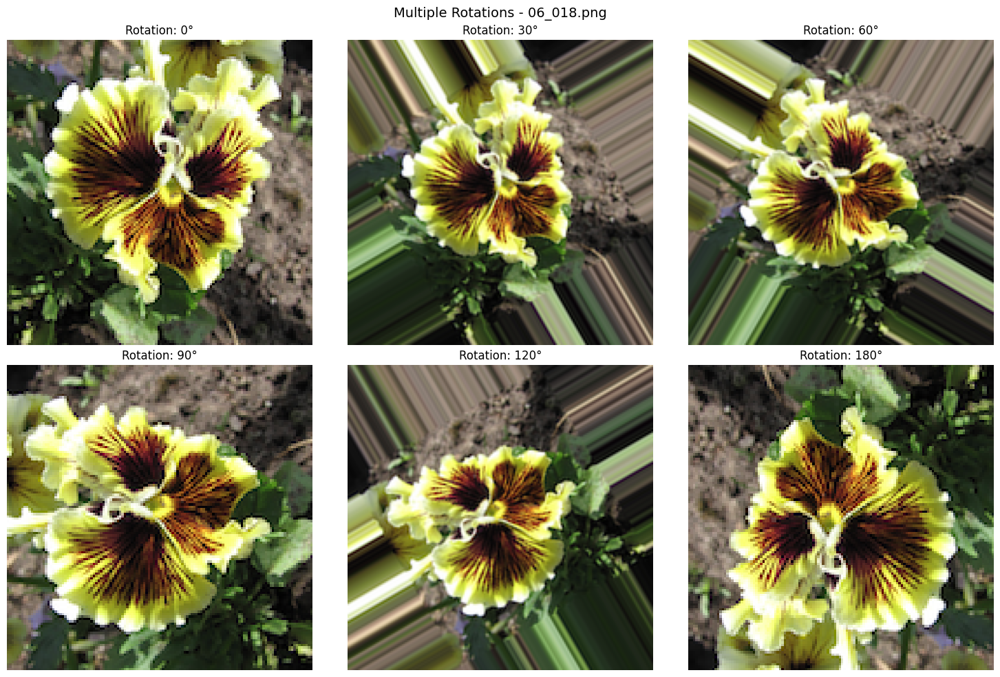

In [ ]:
#  apply various rotation angles
def show_multiple_rotations(image, filename):
    """Show image with different rotation angles"""
    angles = [0, 30, 60, 90, 120, 180]
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()
    
    for i, angle in enumerate(angles):
        if angle == 0:
            rotated_img = image
        else:
            rotated_img = rotate(image, angle, reshape=True, mode='nearest')
        
        axes[i].imshow(rotated_img)
        axes[i].set_title(f'Rotation: {angle}°')
        axes[i].axis('off')
    
    plt.suptitle(f'Multiple Rotations - {filename}', fontsize=14)
    plt.tight_layout()
    plt.show()

if list_img:
    show_multiple_rotations(list_img[0], file_names[0])